In [1]:
import sys
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [2]:
import os
os.getcwd()
import pandas as pd

In [3]:
input_Dir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/"
outDir = "../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/all_V4.2/"

In [4]:
adata = sc.read_h5ad(os.path.join(outDir,'my_results_6k.cells_scvelo_stochastic.h5ad'), chunk_size=6000)

In [5]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'RNA_snn_res.1', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', '

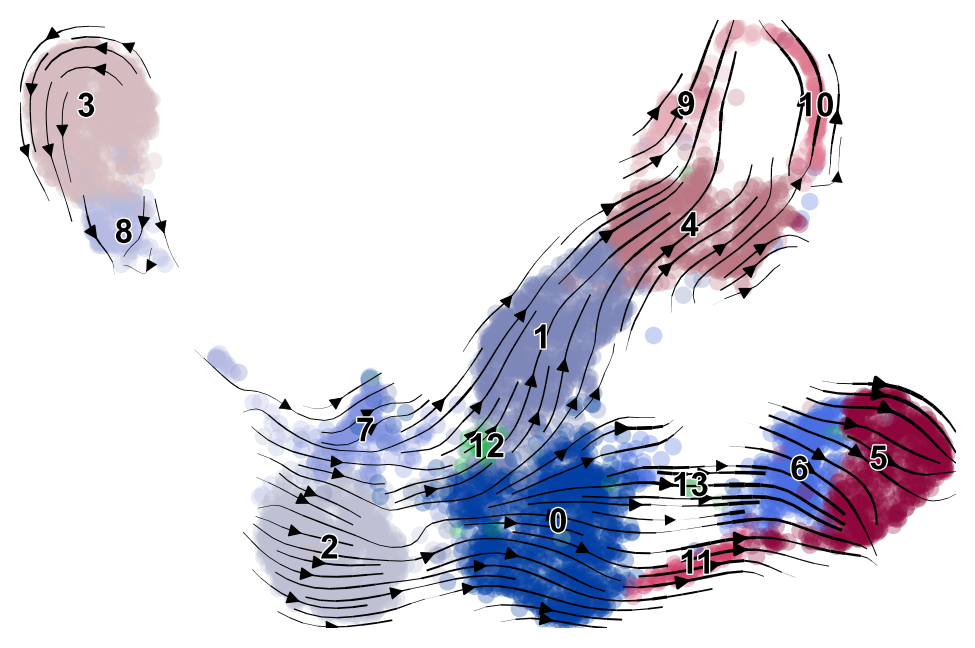

In [6]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "clusters"
)

In [7]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '3')[0]

In [8]:
sc.tl.dpt(adata, n_branchings = 2)

In [9]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'RNA_snn_res.1', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_s

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/all_V4.2/scvelo_dpt_pseudotime.png


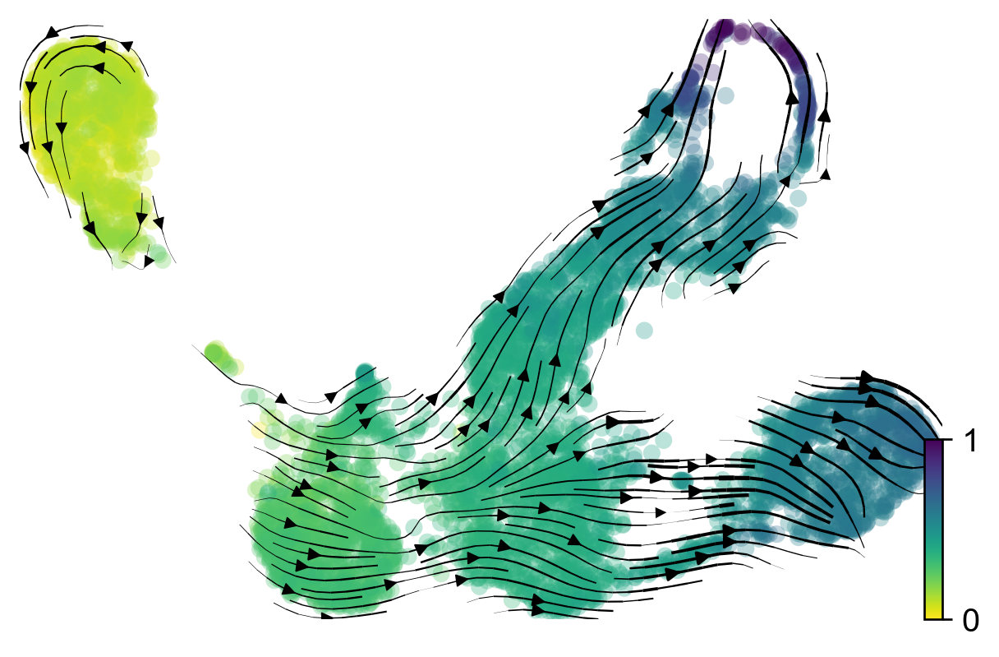

In [83]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "dpt_pseudotime",
    dpi = 120,
    save=os.path.join(outDir, "scvelo_dpt_pseudotime.pdf")
)

figure cannot be saved as pdf, using png instead.
saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/all_V4.2/scvelo_condition.png


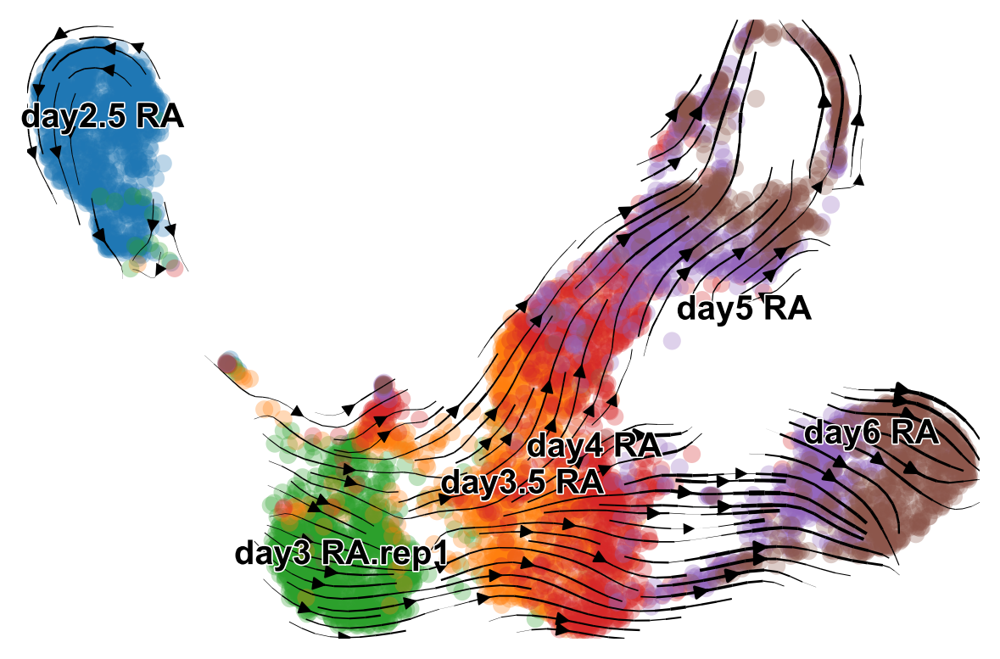

In [82]:
scv.pl.velocity_embedding_stream(
    adata, basis="umap", smooth=0.5, min_mass=1,
    legend_fontsize=12, title="", color = "condition",
    dpi = 120, 
    save=os.path.join(outDir, "scvelo_condition.pdf")
)

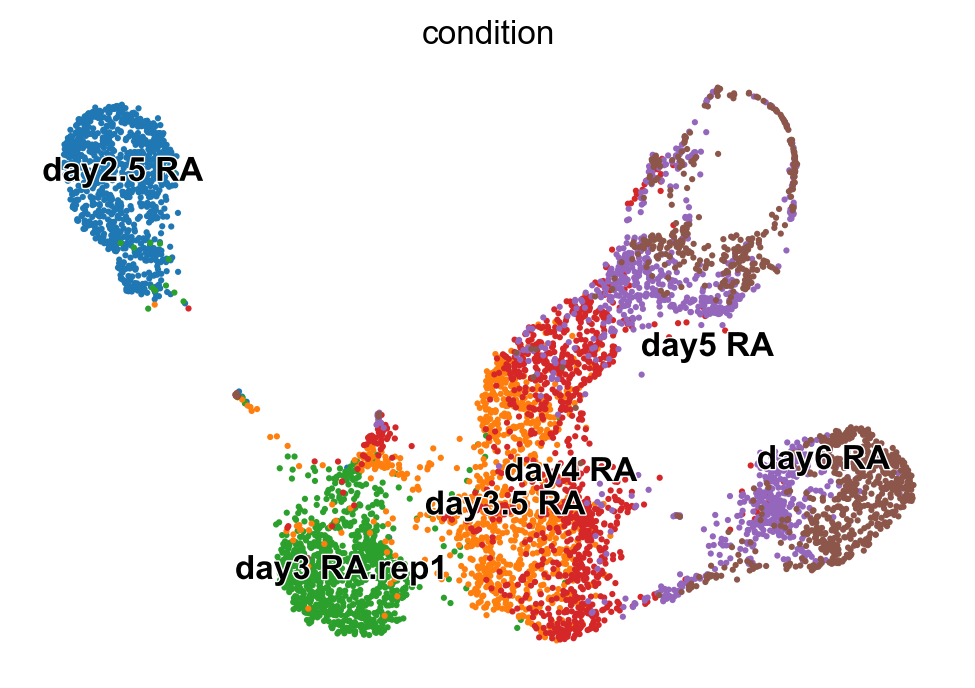

In [13]:
scv.pl.scatter(adata, basis="umap", c="condition")

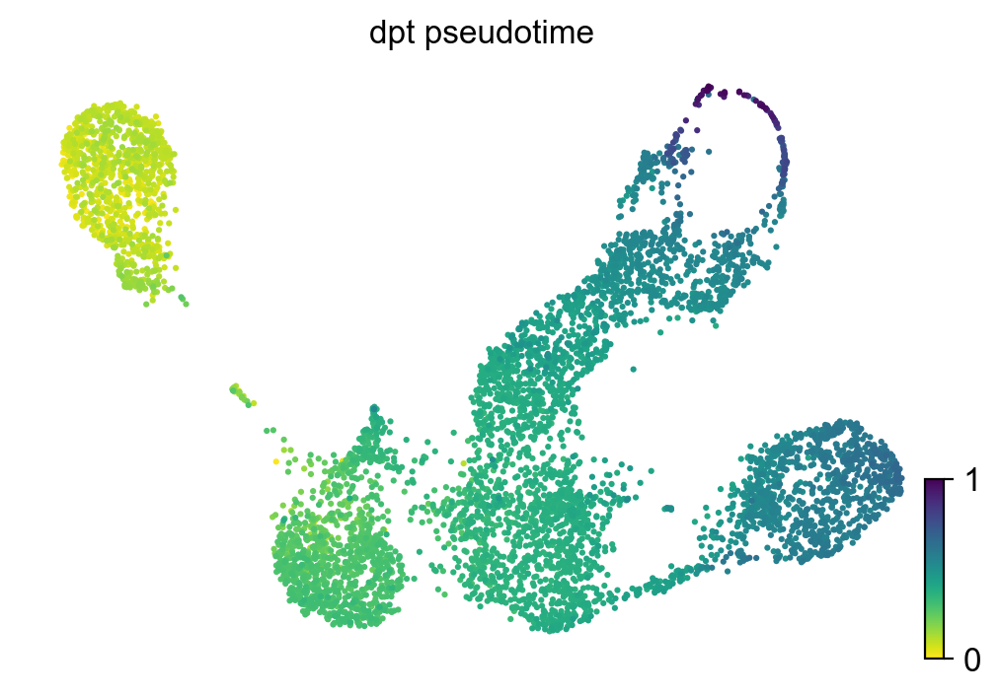

In [14]:
scv.pl.scatter(adata, basis="umap", c="dpt_pseudotime")

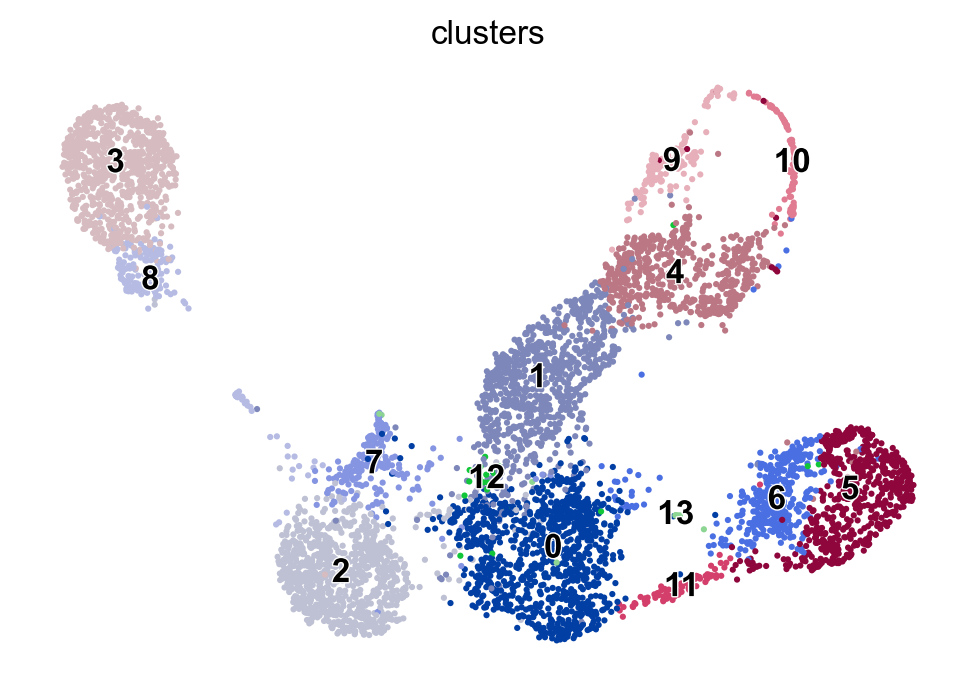

In [15]:
scv.pl.scatter(adata, basis="umap", c="clusters")

In [16]:
### use kernels and estimators https://cellrank.readthedocs.io/en/stable/kernels_and_estimators.html

In [17]:
from cellrank.tl.kernels import VelocityKernel
vk = VelocityKernel(adata)
pk = cr.tl.kernels.PseudotimeKernel(adata)

In [18]:
print(pk)

<PseudotimeKernel>


In [19]:
# Compute a transition matrix
pk.compute_transition_matrix()
vk.compute_transition_matrix()

Computing transition matrix based on `dpt_pseudotime`


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:00<00:00, 6015.70cell/s]


    Finish (0:00:03)
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:35<00:00, 167.23cell/s]

Setting `softmax_scale=19.0819`



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:35<00:00, 167.27cell/s]

    Finish (0:01:12)


<VelocityKernel>

In [25]:
print(pk)

<PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>


In [26]:
# Combining two kernels
from cellrank.tl.kernels import ConnectivityKernel
ck = ConnectivityKernel(adata).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [63]:
combined_kernel = 0.5 * vk + 0.3 *pk + 0.2 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck
#combined_kernel = 0.8 * vk + 0.2 * ck

In [64]:
print(combined_kernel)

((0.5 * <VelocityKernel[softmax_scale=19.08, mode=deterministic, seed=48195, scheme=<CorrelationScheme>]>) + (0.3 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))


In [65]:
# Initialize an estimator
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=6000, kernel=((0.5 * <VelocityKernel[softmax_scale=19.08, mode=deterministic, seed=48195, scheme=<CorrelationScheme>]>) + (0.3 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000044e+00 1.2891818977598776e-03 -1.7603624087701816e-02 -1.6473300783537353e-02 -2.7504959693643561e-03 -2.9325340693531435e-03 
0.0000000000000000e+00 9.9516376022718689e-01 -1.6270198057890487e-03 4.1220280342042148e-03 8.6769907320676052e-03 1.9778245025040379e-02 
0.0000000000000000e+00 0.0000000000000000e+00 9.7838107552839704e-01 3.1894032648155261e-02 1.0814570559639046e-02 -2.4414449629278308e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.7264559780201776e-01 -4.6341607618659526e-02 1.4896716338032363e-02 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.6913578763012131e-01 9.2696324225510773e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.5584036283147855e-01 
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_

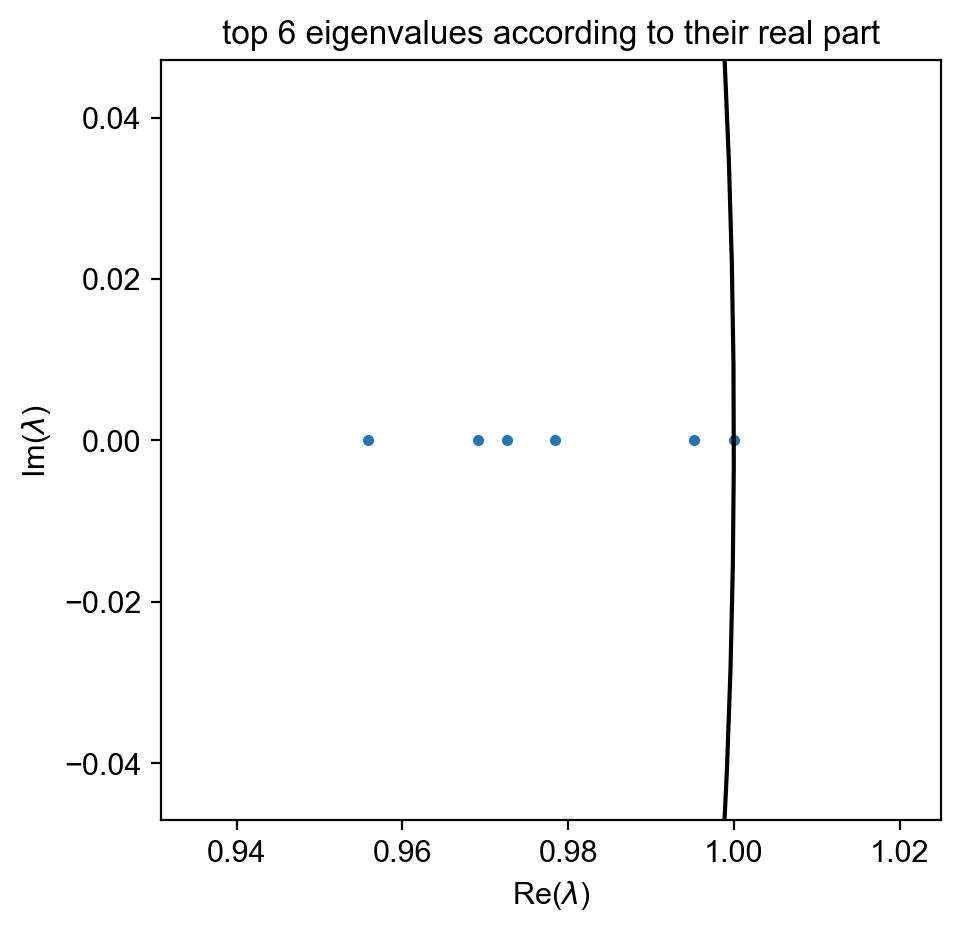

In [66]:
# Compute a matrix decomposition
g.compute_schur(n_components=6) # method with 'brandts', otherwise kernel will be killed; take really a long time for 40k cells 
g.plot_spectrum()

Computing `6` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)


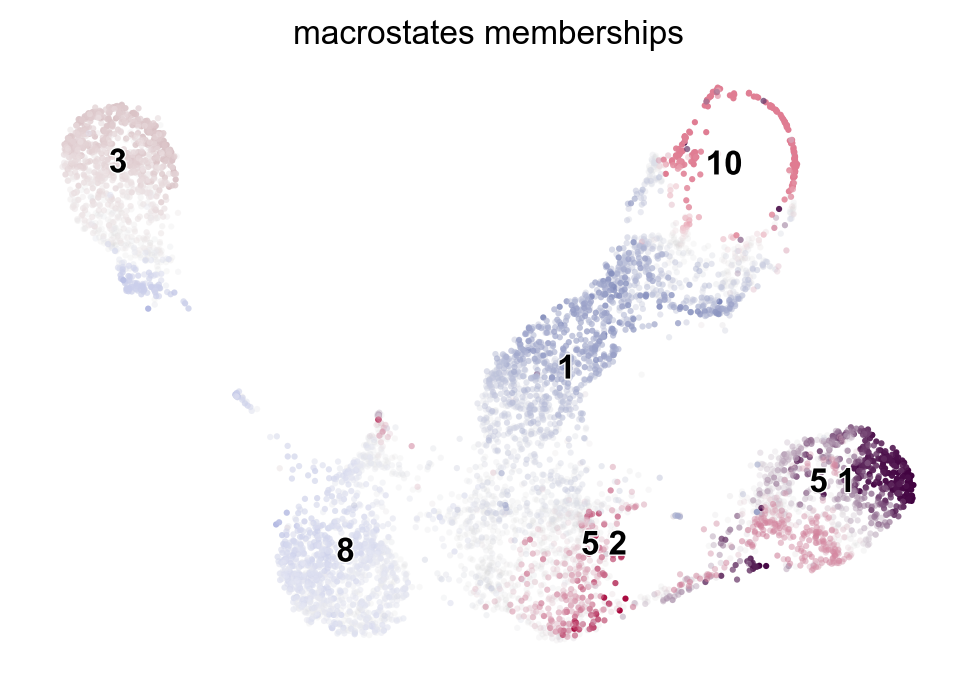

In [67]:
# Infer terminal states
g.compute_macrostates(n_states = 6, cluster_key="clusters")
g.plot_macrostates()

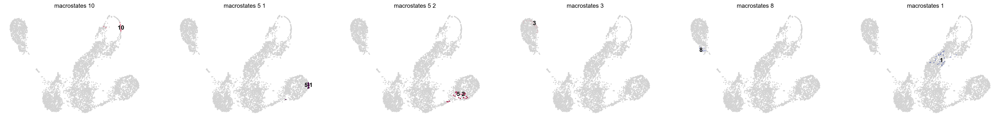

In [68]:
g.plot_macrostates(same_plot=False, discrete=True)

In [69]:
#(adata[adata.obs['clusters'] == '10']).obs_names[:50]

In [70]:
g.set_terminal_states({"Neurons": adata[adata.obs["clusters"] == "10"].obs_names}, add_to_existing=False)
g.set_terminal_states({"FP": adata[adata.obs["clusters"] == "5"].obs_names}, add_to_existing=True)

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [71]:
## manually set the termianl states
#Neurons = (adata[adata.obs['clusters'] == '10']).obs_names[:50]
#FP = (adata[adata.obs['clusters'] == '5']).obs_names[:50]
#tLable = pd.DataFrame({
#    'Neurons': Neurons,
#    'FP': FP
#})

#tLable = tLable.to_dict(orient='list')
#g.set_terminal_states(labels=tLable, cluster_key='clusters', add_to_existing=False)
# g.compute_terminal_states()
#g.set_terminal_states(labels = pd.Series(["5", "10"], dtype="category"), 
#                      cluster_key = 'clusters')

In [72]:
g.compute_absorption_probabilities()

Computing absorption probabilities


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 32.11/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


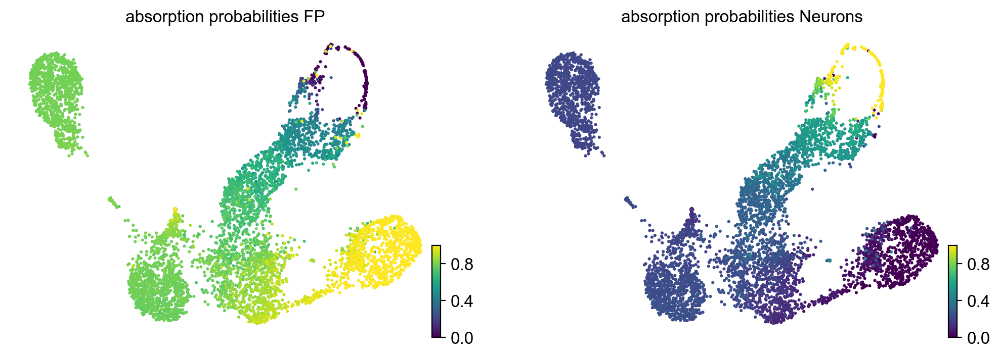

In [73]:
g.plot_absorption_probabilities(discrete = True, same_plot = False)

saving figure to file ../results/scRNAseq_R13547_10x_mNT_20220813/RA_symetryBreaking/all_V4.2/cellrank_absorption_probs_vk0.5_pk0.3_ck0.2.pdf


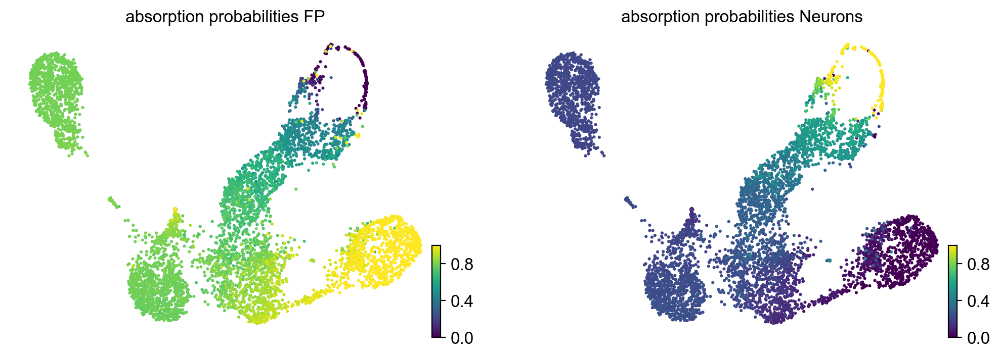

In [75]:
g.plot_absorption_probabilities(discrete = True, 
                                same_plot = False, 
                                save=os.path.join(outDir, "cellrank_absorption_probs_vk0.5_pk0.3_ck0.2.pdf"))

In [85]:
fp_drivers = g.compute_lineage_drivers(lineages="FP", return_drivers=True)
fp_drivers.sort_values(by="FP_corr", ascending=False)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,FP_corr,FP_pval,FP_qval,FP_ci_low,FP_ci_high
Peg3,0.504457,0.000000e+00,0.000000e+00,0.485348,0.523084
Vtn,0.496979,0.000000e+00,0.000000e+00,0.477682,0.515797
Shh,0.465093,0.000000e+00,0.000000e+00,0.445026,0.484692
Igfbp5,0.447708,1.008362e-304,2.016724e-302,0.427244,0.467713
Cmtm8,0.437946,1.153180e-289,2.162213e-287,0.417266,0.458172
...,...,...,...,...,...
Miat,-0.497079,0.000000e+00,0.000000e+00,-0.515894,-0.477784
Elavl3,-0.502860,0.000000e+00,0.000000e+00,-0.521528,-0.483711
Mir124-2hg,-0.541829,0.000000e+00,0.000000e+00,-0.559462,-0.523705
Neurod4,-0.542939,0.000000e+00,0.000000e+00,-0.560542,-0.524846


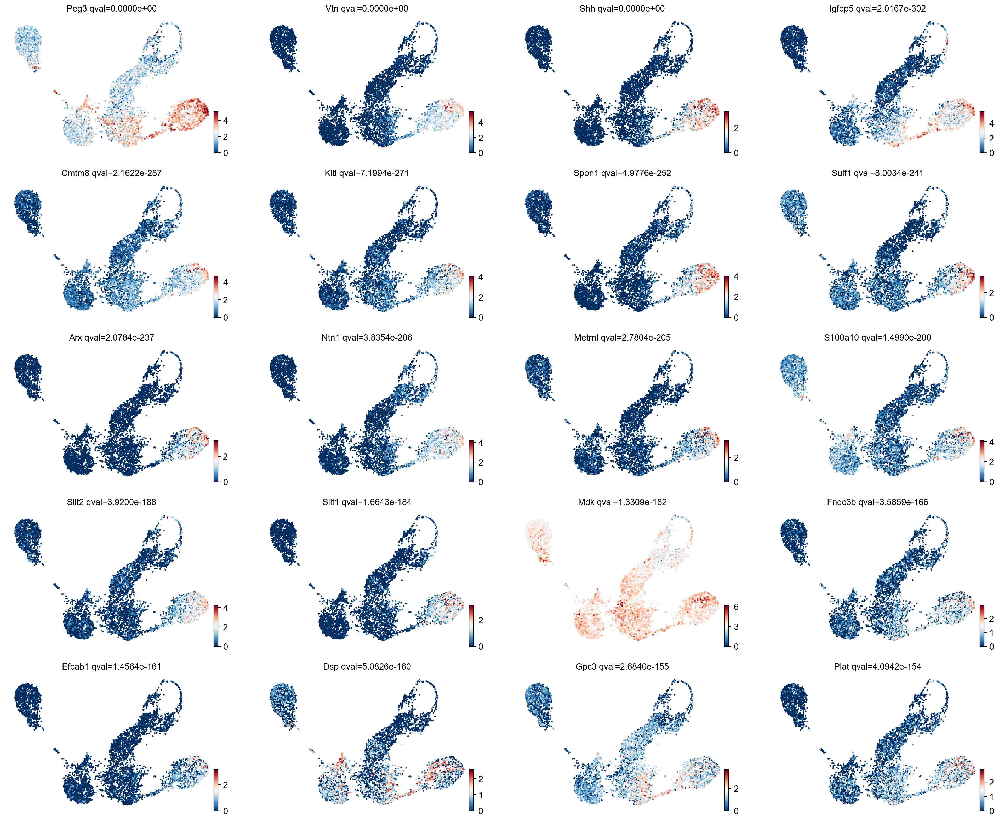

In [87]:
g.plot_lineage_drivers("FP", n_genes=20)

In [88]:
nr_drivers = g.compute_lineage_drivers(lineages="Neurons", return_drivers=True)
nr_drivers.sort_values(by="Neurons_corr", ascending=False)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,Neurons_corr,Neurons_pval,Neurons_qval,Neurons_ci_low,Neurons_ci_high
Srrm4,0.589344,0.000000e+00,0.000000e+00,0.572578,0.605616
Neurod4,0.542939,0.000000e+00,0.000000e+00,0.524846,0.560542
Mir124-2hg,0.541829,0.000000e+00,0.000000e+00,0.523705,0.559462
Elavl3,0.502860,0.000000e+00,0.000000e+00,0.483711,0.521528
Miat,0.497078,0.000000e+00,0.000000e+00,0.477784,0.515893
...,...,...,...,...,...
Cmtm8,-0.437946,1.150929e-289,2.157992e-287,-0.458173,-0.417266
Igfbp5,-0.447708,1.006107e-304,2.012214e-302,-0.467714,-0.427245
Shh,-0.465093,0.000000e+00,0.000000e+00,-0.484693,-0.445026
Vtn,-0.496980,0.000000e+00,0.000000e+00,-0.515797,-0.477683


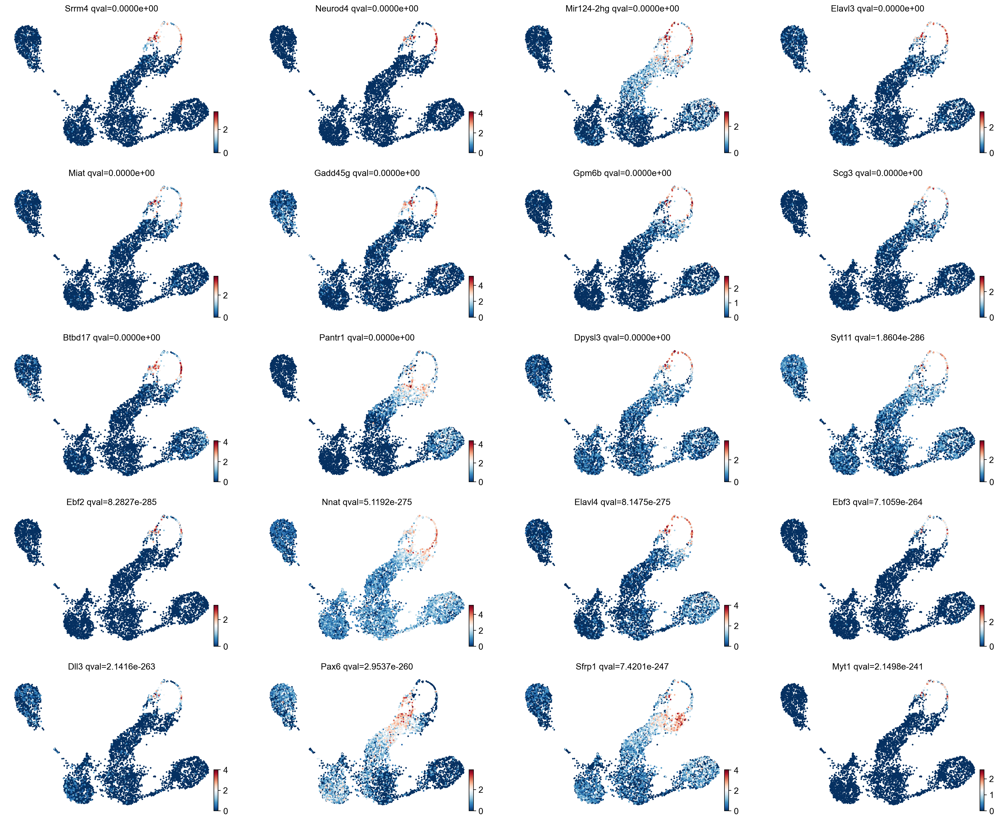

In [89]:
g.plot_lineage_drivers("Neurons", n_genes=20)

In [91]:
fp_drivers.to_csv(os.path.join(outDir,'res_fp_drivers.csv'))
nr_drivers.to_csv(os.path.join(outDir,'res_neuron_drivers.csv'))

In [ ]:
##############
## test peudotime kernel and cytotrace kernel  
##############

In [22]:
adata = sc.read_h5ad(os.path.join(outDir,'my_results_6k.cells_scvelo_stochastic.h5ad'), chunk_size=6000)

In [23]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'RNA_snn_res.1', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', '

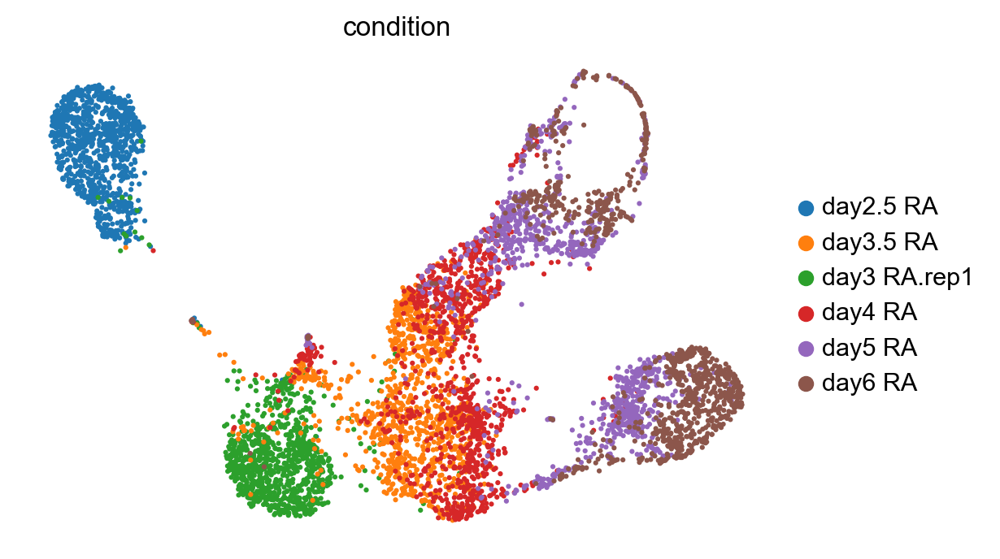

In [24]:
scv.pl.scatter(adata, basis="umap", c="condition", legend_loc="right")

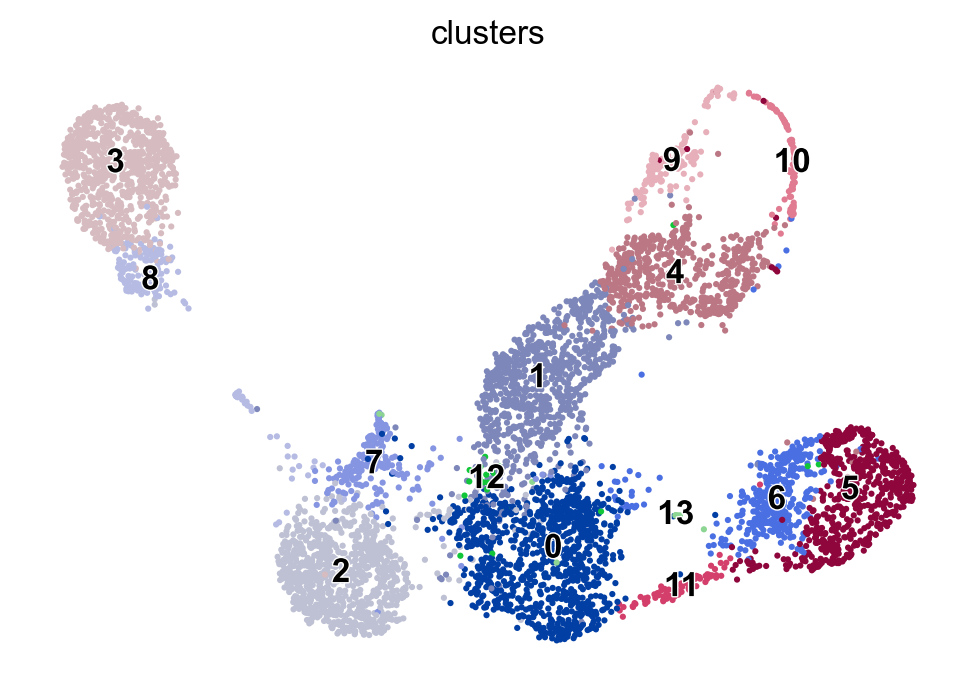

In [26]:
scv.pl.scatter(adata, basis="umap", c="clusters")

In [27]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['clusters']  == '3')[0]

In [28]:
sc.tl.dpt(adata, n_branchings = 2)

In [29]:
adata

AnnData object with n_obs × n_vars = 6000 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'condition', 'iscell_dd', 'cell.id', 'percent.mt', 'DF_out', 'percent.rb', 'S.Score', 'G2M.Score', 'Phase', 'celltypes', 'RNA_snn_res.0.7', 'seurat_clusters', 'RNA_snn_res.1', 'clusters', 'time', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'spliced_features', 'unspliced_features', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_s

In [30]:
# Initialize the CytoTRACE kernel
#from cellrank.tl.kernels import CytoTRACEKernel
#ctk = CytoTRACEKernel(adata)


AttributeError: 'NoneType' object has no attribute 'n_obs'

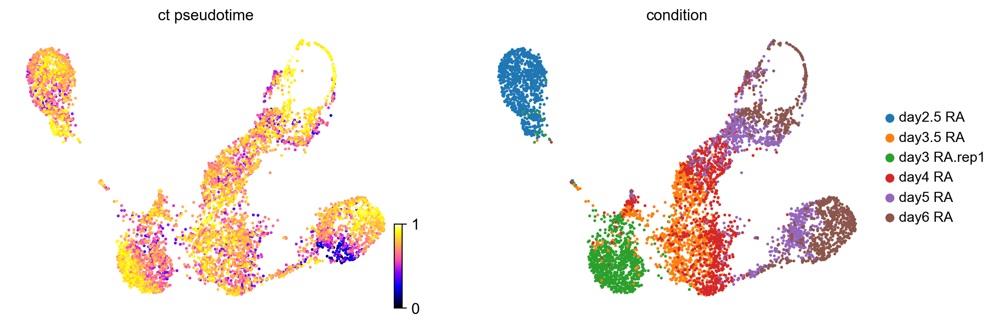

In [42]:
scv.pl.scatter(
    adata,
    c=["ct_pseudotime", "condition"],
    basis="umap",
    legend_loc="right",
    color_map="gnuplot2",
)

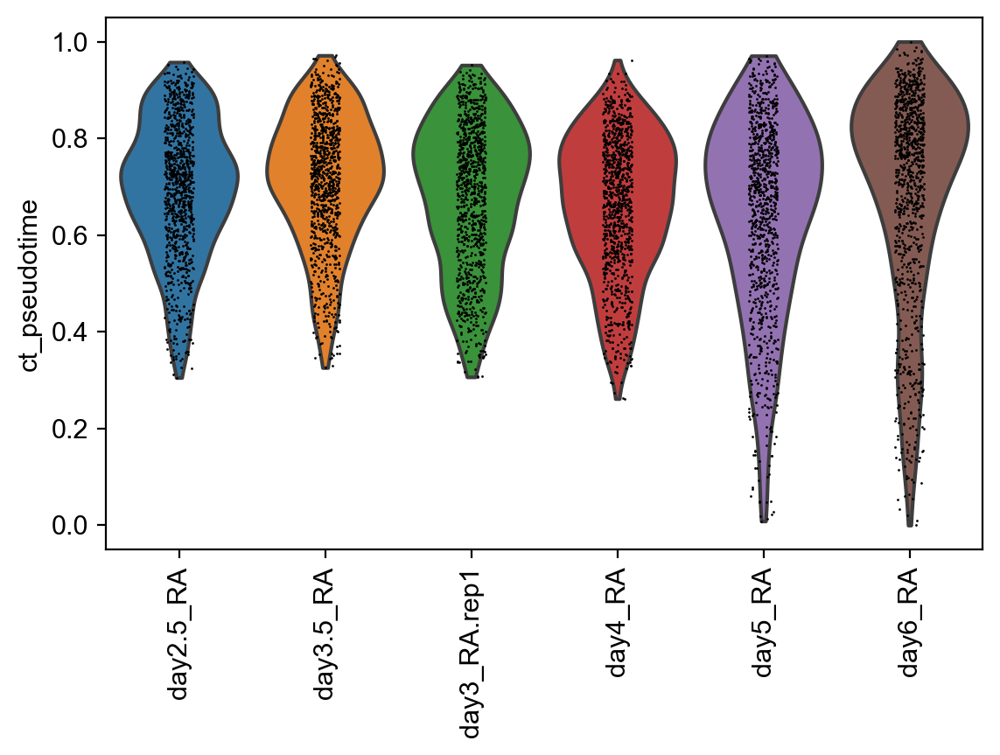

In [43]:
sc.pl.violin(adata, keys=["ct_pseudotime"], groupby="condition", rotation=90)

In [5]:
from cellrank.external.kernels import WOTKernel
from cellrank.tl.kernels import ConnectivityKernel
from cellrank.tl.estimators import GPCCA

In [6]:
wk = WOTKernel(adata, time_key="time")

Computing `proliferation` scores
Computing `apoptosis` scores


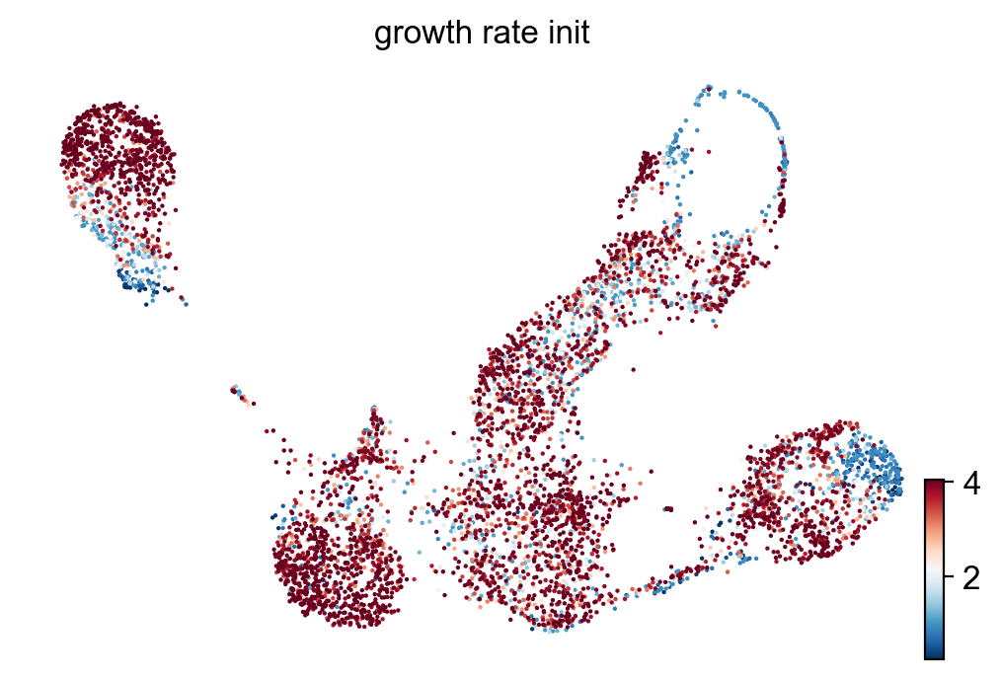

In [8]:
wk.compute_initial_growth_rates(organism="mouse", key_added="growth_rate_init")
scv.pl.scatter(
    adata, c="growth_rate_init", legend_loc="right", basis="umap", s=10
)

In [9]:
wk.compute_transition_matrix(
    growth_iters=3, growth_rate_key="growth_rate_init", last_time_point="connectivities"
)

Computing transition matrix using Waddington optimal transport
Using `3000` HVGs from `adata.var['highly_variable']`
Using default cost matrices
Computing transport maps for `5` time pairs


  0%|                                                                                                                                                                                    | 0/5 [00:00<?, ?time pair/s]


TypeError: compute_transport_map() got an unexpected keyword argument 'cost_matrix'